Make sure you have installed `boto3`

In [1]:
!pip install -q boto3

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


SysAdmin task: attach `AmazonRekognitionFullAccess` to role `LabRole`

# 1. Upload `train` and `test` dirs under `s3` bucket `rekognition-fauna-empty`.

In [2]:
import os
import glob
import itertools
import pathlib
import datetime

import boto3

The path in `s3` bucket will be created using the date of execution of next cells. Example:

In [3]:
bucket_for_train_and_test_datasets = "rekognition-fauna-empty-academy"

In [4]:
date_today = datetime.date.today().strftime("%d-%m-%Y")
destiny_dir = os.path.join(bucket_for_train_and_test_datasets,
                            date_today)
print(destiny_dir)

rekognition-fauna-empty-academy/16-03-2022


For this step dirs `train` and `test` need to exist in `/shared_volume` directory.

In [5]:
input_dir = "/shared_volume/rekognition"
os.makedirs(input_dir, exist_ok=True)
train = os.path.join(input_dir,
                     "train")
test  = os.path.join(input_dir,
                    "test")

In [6]:
print(train)

/shared_volume/rekognition/train


In [7]:
print(test)

/shared_volume/rekognition/test


Undear each dir of `train` and `test` subdirectories with name of classes need to exist

In [9]:
%%bash
ls /shared_volume/rekognition/train

empty
fauna


In [10]:
%%bash
ls /shared_volume/rekognition/test

empty
fauna


Next function will be used to get path of images in `train` and `test` dirs.

In [11]:
def multiple_file_types(input_directory, patterns, recursive=False):
    """
    Return iterable with files that have a common pattern. Will search
    in a recursive or non recursive way.
    Args:
        input_directory (str): directory where files with common pattern
        will be searched.
        patterns (list): list of patterns to search for.
    Returns:
        iterable with files that have a common pattern.
    """
    if recursive:
        expression = "/**/*"
    else:
        expression = "/*"
    return itertools.chain.from_iterable(glob.iglob(input_directory + \
                                                    expression + pattern,
                                                    recursive=recursive) for pattern in patterns)

Next cells will upload to s3 and save urls where were uploaded in `dict_train_with_classes_paths_and_keys_in_s3` and `dict_test_with_classes_paths_and_keys_in_s3` lists

Include `rekognition-fauna-empty-academy` bucket to policy `list-buckets-academy`

In [12]:
input_directory = "/shared_volume/rekognition/"
patterns = ["JPG"]

In [13]:
s3 = boto3.client('s3')

In [14]:
iterator = multiple_file_types(input_directory, patterns, recursive=True)

In [15]:
dict_train_with_classes_paths_and_keys_in_s3 = {}
dict_test_with_classes_paths_and_keys_in_s3 = {}

In [16]:
for file_img in iterator:
    print("file: %s" % file_img)
    file_img_pathlib = pathlib.Path(file_img)
    name_of_class = file_img_pathlib.parent.name
    upload = False
    if not name_of_class in dict_train_with_classes_paths_and_keys_in_s3 and "train" in file_img:
        dict_train_with_classes_paths_and_keys_in_s3[name_of_class] = {}
    if not name_of_class in dict_test_with_classes_paths_and_keys_in_s3 and "test" in file_img:
        dict_test_with_classes_paths_and_keys_in_s3[name_of_class] = {}
    if "train" in file_img:
        dst_file = os.path.join(date_today,
                                "train",
                                 name_of_class,
                                 file_img_pathlib.name)
        s3_dst_file = os.path.join("s3://",
                                   bucket_for_train_and_test_datasets,
                                   dst_file)
        dict_train_with_classes_paths_and_keys_in_s3[name_of_class][s3_dst_file] = dst_file
        upload=True
    else:
        if "test" in file_img:
            dst_file = os.path.join(date_today,
                                    "test",
                                     name_of_class,
                                     file_img_pathlib.name)
            s3_dst_file = os.path.join("s3://",
                                       bucket_for_train_and_test_datasets,
                                       dst_file)
            dict_test_with_classes_paths_and_keys_in_s3[name_of_class][s3_dst_file] = dst_file
            upload=True
    if upload:
        print("will be uploaded in bucket %s to: %s" % (bucket_for_train_and_test_datasets,
                                                        dst_file))
        print("uploading...")
        s3.upload_file(file_img, bucket_for_train_and_test_datasets, dst_file)
    else:
        print("will not be uploaded")

file: /shared_volume/rekognition/validation/EK000022.JPG
will not be uploaded
file: /shared_volume/rekognition/validation/EK000064.JPG
will not be uploaded
file: /shared_volume/rekognition/validation/EK000205.JPG
will not be uploaded
file: /shared_volume/rekognition/validation/EK000163.JPG
will not be uploaded
file: /shared_volume/rekognition/validation/02090205.JPG
will not be uploaded
file: /shared_volume/rekognition/validation/01010104.JPG
will not be uploaded
file: /shared_volume/rekognition/validation/EK000095.JPG
will not be uploaded
file: /shared_volume/rekognition/validation/EK000001.JPG
will not be uploaded
file: /shared_volume/rekognition/validation/01080049.JPG
will not be uploaded
file: /shared_volume/rekognition/validation/01010028.JPG
will not be uploaded
file: /shared_volume/rekognition/validation/01070118.JPG
will not be uploaded
file: /shared_volume/rekognition/validation/EK000099.JPG
will not be uploaded
file: /shared_volume/rekognition/validation/EK000073.JPG
will no

In [17]:
dict_train_with_classes_paths_and_keys_in_s3

{'empty': {'s3://rekognition-fauna-empty-academy/16-03-2022/train/empty/DSCN8837.JPG': '16-03-2022/train/empty/DSCN8837.JPG',
  's3://rekognition-fauna-empty-academy/16-03-2022/train/empty/01140004.JPG': '16-03-2022/train/empty/01140004.JPG',
  's3://rekognition-fauna-empty-academy/16-03-2022/train/empty/EK000092.JPG': '16-03-2022/train/empty/EK000092.JPG',
  's3://rekognition-fauna-empty-academy/16-03-2022/train/empty/EK002914.JPG': '16-03-2022/train/empty/EK002914.JPG',
  's3://rekognition-fauna-empty-academy/16-03-2022/train/empty/01130893.JPG': '16-03-2022/train/empty/01130893.JPG'},
 'fauna': {'s3://rekognition-fauna-empty-academy/16-03-2022/train/fauna/01040838.JPG': '16-03-2022/train/fauna/01040838.JPG',
  's3://rekognition-fauna-empty-academy/16-03-2022/train/fauna/01010594.JPG': '16-03-2022/train/fauna/01010594.JPG',
  's3://rekognition-fauna-empty-academy/16-03-2022/train/fauna/EK001073.JPG': '16-03-2022/train/fauna/EK001073.JPG',
  's3://rekognition-fauna-empty-academy/16-03

In [18]:
dict_test_with_classes_paths_and_keys_in_s3

{'empty': {'s3://rekognition-fauna-empty-academy/16-03-2022/test/empty/EK000010.JPG': '16-03-2022/test/empty/EK000010.JPG',
  's3://rekognition-fauna-empty-academy/16-03-2022/test/empty/EK000424.JPG': '16-03-2022/test/empty/EK000424.JPG',
  's3://rekognition-fauna-empty-academy/16-03-2022/test/empty/EK003330.JPG': '16-03-2022/test/empty/EK003330.JPG',
  's3://rekognition-fauna-empty-academy/16-03-2022/test/empty/01220084.JPG': '16-03-2022/test/empty/01220084.JPG',
  's3://rekognition-fauna-empty-academy/16-03-2022/test/empty/01040322.JPG': '16-03-2022/test/empty/01040322.JPG',
  's3://rekognition-fauna-empty-academy/16-03-2022/test/empty/01010589.JPG': '16-03-2022/test/empty/01010589.JPG'},
 'fauna': {'s3://rekognition-fauna-empty-academy/16-03-2022/test/fauna/EK003729.JPG': '16-03-2022/test/fauna/EK003729.JPG',
  's3://rekognition-fauna-empty-academy/16-03-2022/test/fauna/EK001446.JPG': '16-03-2022/test/fauna/EK001446.JPG',
  's3://rekognition-fauna-empty-academy/16-03-2022/test/fauna

Urls in s3:

In [19]:
for name_of_class in dict_train_with_classes_paths_and_keys_in_s3.keys():
    print(name_of_class)
    print(list(dict_train_with_classes_paths_and_keys_in_s3[name_of_class].keys()))

empty
['s3://rekognition-fauna-empty-academy/16-03-2022/train/empty/DSCN8837.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/train/empty/01140004.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/train/empty/EK000092.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/train/empty/EK002914.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/train/empty/01130893.JPG']
fauna
['s3://rekognition-fauna-empty-academy/16-03-2022/train/fauna/01040838.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/train/fauna/01010594.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/train/fauna/EK001073.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/train/fauna/01010585.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/train/fauna/01010590.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/train/fauna/EK002333.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/train/fauna/EK001488.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/train/fauna/EK000820.JPG'

In [20]:
for name_of_class in dict_test_with_classes_paths_and_keys_in_s3.keys():
    print(name_of_class)
    print(list(dict_test_with_classes_paths_and_keys_in_s3[name_of_class].keys()))

empty
['s3://rekognition-fauna-empty-academy/16-03-2022/test/empty/EK000010.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/test/empty/EK000424.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/test/empty/EK003330.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/test/empty/01220084.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/test/empty/01040322.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/test/empty/01010589.JPG']
fauna
['s3://rekognition-fauna-empty-academy/16-03-2022/test/fauna/EK003729.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/test/fauna/EK001446.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/test/fauna/EK900054.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/test/fauna/EK001503.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/test/fauna/EK000002.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/test/fauna/EK009851.JPG', 's3://rekognition-fauna-empty-academy/16-03-2022/test/fauna/01020612.JPG']


Check if files exists in `s3`

https://stackoverflow.com/questions/33842944/check-if-a-key-exists-in-a-bucket-in-s3-using-boto3

In [21]:
s3 = boto3.resource('s3')

In [22]:
s3_bucket = s3.Bucket(bucket_for_train_and_test_datasets)

In [23]:
for name_of_class in dict_train_with_classes_paths_and_keys_in_s3:
    for path_in_s3 in dict_train_with_classes_paths_and_keys_in_s3[name_of_class]:
        key_in_s3 = dict_train_with_classes_paths_and_keys_in_s3[name_of_class][path_in_s3]
        objs = list(s3_bucket.objects.filter(Prefix=key_in_s3))
        if(len(objs)>0):
            print("key exists!!")
        else:
            print("key doesn't exist!")

key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!


In [24]:
for name_of_class in dict_test_with_classes_paths_and_keys_in_s3:
    for path_in_s3 in dict_test_with_classes_paths_and_keys_in_s3[name_of_class]:
        key_in_s3 = dict_test_with_classes_paths_and_keys_in_s3[name_of_class][path_in_s3]
        objs = list(s3_bucket.objects.filter(Prefix=key_in_s3))
        if(len(objs)>0):
            print("key exists!!")
        else:
            print("key doesn't exist!")

key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!
key exists!!


# 3. Create train and test manifests

In [25]:
import json

In [26]:
def create_manifest(type_of_manifest,
                    d_with_classes_paths_and_keys_in_s3):
    d_now = datetime.datetime.now().isoformat()
    d_now = d_now[0:len(d_now)-3] #just 3 decimals
    counter = 0
    name_manifest = "".join([type_of_manifest,
                             ".manifest"])
    with open(name_manifest, "w+") as dst:
        for name_of_class in d_with_classes_paths_and_keys_in_s3:
            for path_in_s3 in d_with_classes_paths_and_keys_in_s3[name_of_class].keys():
                d_aux = {"confidence": 1,
                         "class-name": name_of_class,
                         "human-annotated": "yes",
                         "creation-date": d_now,
                         "type": "groundtruth/image-classification"
                        }
                name_dataset = "".join([type_of_manifest,
                                        "dataset-classification_",
                                        name_of_class])
                name_metadata = "".join([name_dataset,
                                         "-metadata"])
                d_manifest = {"source-ref": path_in_s3,
                              name_dataset: counter,
                              name_metadata: d_aux
                              }
                json.dump(d_manifest, dst)
                dst.write("\n")
            counter += 1
    return name_manifest

In [27]:
name_manifest_train = create_manifest("train",
                                      dict_train_with_classes_paths_and_keys_in_s3)

In [28]:
name_manifest_train

'train.manifest'

In [29]:
%%bash
cat train.manifest

{"source-ref": "s3://rekognition-fauna-empty-academy/16-03-2022/train/empty/DSCN8837.JPG", "traindataset-classification_empty": 0, "traindataset-classification_empty-metadata": {"confidence": 1, "class-name": "empty", "human-annotated": "yes", "creation-date": "2022-03-16T17:05:22.755", "type": "groundtruth/image-classification"}}
{"source-ref": "s3://rekognition-fauna-empty-academy/16-03-2022/train/empty/01140004.JPG", "traindataset-classification_empty": 0, "traindataset-classification_empty-metadata": {"confidence": 1, "class-name": "empty", "human-annotated": "yes", "creation-date": "2022-03-16T17:05:22.755", "type": "groundtruth/image-classification"}}
{"source-ref": "s3://rekognition-fauna-empty-academy/16-03-2022/train/empty/EK000092.JPG", "traindataset-classification_empty": 0, "traindataset-classification_empty-metadata": {"confidence": 1, "class-name": "empty", "human-annotated": "yes", "creation-date": "2022-03-16T17:05:22.755", "type": "groundtruth/image-classification"}}
{

In [30]:
name_manifest_test = create_manifest("test",
                                     dict_test_with_classes_paths_and_keys_in_s3)

In [31]:
name_manifest_test

'test.manifest'

In [32]:
%%bash
cat test.manifest

{"source-ref": "s3://rekognition-fauna-empty-academy/16-03-2022/test/empty/EK000010.JPG", "testdataset-classification_empty": 0, "testdataset-classification_empty-metadata": {"confidence": 1, "class-name": "empty", "human-annotated": "yes", "creation-date": "2022-03-16T17:05:49.173", "type": "groundtruth/image-classification"}}
{"source-ref": "s3://rekognition-fauna-empty-academy/16-03-2022/test/empty/EK000424.JPG", "testdataset-classification_empty": 0, "testdataset-classification_empty-metadata": {"confidence": 1, "class-name": "empty", "human-annotated": "yes", "creation-date": "2022-03-16T17:05:49.173", "type": "groundtruth/image-classification"}}
{"source-ref": "s3://rekognition-fauna-empty-academy/16-03-2022/test/empty/EK003330.JPG", "testdataset-classification_empty": 0, "testdataset-classification_empty-metadata": {"confidence": 1, "class-name": "empty", "human-annotated": "yes", "creation-date": "2022-03-16T17:05:49.173", "type": "groundtruth/image-classification"}}
{"source-r

Upload manifests to bucket

In [33]:
bucket_for_train_and_test_datasets

'rekognition-fauna-empty-academy'

In [34]:
dst_manifest_train = os.path.join(date_today,
                                  name_manifest_train)          

In [35]:
dst_manifest_train

'16-03-2022/train.manifest'

In [36]:
s3 = boto3.client('s3')

In [37]:
s3.upload_file(name_manifest_train, bucket_for_train_and_test_datasets, dst_manifest_train)

In [38]:
dst_manifest_test = os.path.join(date_today,
                                 name_manifest_test)

In [39]:
dst_manifest_test

'16-03-2022/test.manifest'

In [40]:
s3.upload_file(name_manifest_test, bucket_for_train_and_test_datasets, dst_manifest_test)

# 4. Create rekognition project

In [41]:
from botocore.exceptions import ClientError

In [42]:
def create_project(project_name,
                   region):
#Copyright 2021 Amazon.com, Inc. or its affiliates. All Rights Reserved.
#PDX-License-Identifier: MIT-0 (For details, see https://github.com/awsdocs/amazon-rekognition-custom-labels-developer-guide/blob/master/LICENSE-SAMPLECODE.)
    """
    Creates an Amazon Rekognition Custom Labels project
    :param project_name: A name for the new project.
    :param region: name of region where AWS rekognition will be used.
    """

    try:
        #Create the project
        print(f"Creating project: {project_name}")
        rek_client=boto3.client('rekognition', region_name=region)
        response=rek_client.create_project(ProjectName=project_name)
        
        print(f"project ARN: {response['ProjectArn']}")
        
        print(f"Finished creating project: {project_name}")

        return response['ProjectArn']
   
    except ClientError as err:  
        print(f"Couldn't create project - {project_name}: {err.response['Error']['Message']}")
        print(f"Problem creating project: {err}")

In [43]:
region = "us-east-1"
project_name = "".join(["fauna_empty_",
                        date_today])

In [44]:
project_name

'fauna_empty_16-03-2022'

In [45]:
rekog_proj_arn = create_project(project_name,region)

Creating project: fauna_empty_16-03-2022
project ARN: arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/1647471979309
Finished creating project: fauna_empty_16-03-2022


In [46]:
rekog_proj_arn

'arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/1647471979309'

# 5. Create train and test datasets from manifest

https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/md-create-manifest-file.html#create-dataset-procedure-manifest-file

https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/cd-create-dataset-sdk.html

https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/md-create-dataset-ground-truth-sdk.html



In [47]:
import time


In [48]:
def create_dataset(project_arn, dataset_type, bucket, manifest_file, region):
#Copyright 2021 Amazon.com, Inc. or its affiliates. All Rights Reserved.
#PDX-License-Identifier: MIT-0 (For details, see https://github.com/awsdocs/amazon-rekognition-custom-labels-developer-guide/blob/master/LICENSE-SAMPLECODE.)

    """
    Creates an Amazon Rekognition Custom Labels dataset.
    :param project_arn: The ARN of the project in which you want to create a dataset.
    :param dataset_type: The type of the dataset that you want to create (train or test).
    :param bucket: The S3 bucket that contains the manifest file.
    :param manifest_file: The path and filename of the manifest file.
    :param region: name of region where AWS rekognition will be used.
    """

    try:
        rek_client=boto3.client('rekognition', region_name=region)
        #Create the project
        print(f"Creating {dataset_type} dataset for project {project_arn}")

        dataset_type = dataset_type.upper()

        dataset_source = json.loads(
            '{ "GroundTruthManifest": { "S3Object": { "Bucket": "'
            + bucket
            + '", "Name": "'
            + manifest_file
            + '" } } }'
        )

        response = rek_client.create_dataset(
            ProjectArn=project_arn, DatasetType=dataset_type, DatasetSource=dataset_source
        )

        dataset_arn=response['DatasetArn']

        print(f"dataset ARN: {dataset_arn}")

        finished=False
        while finished==False:

            dataset=rek_client.describe_dataset(DatasetArn=dataset_arn)

            status=dataset['DatasetDescription']['Status']
            
            if status == "CREATE_IN_PROGRESS":
                
                print((f"Creating dataset: {dataset_arn} "))
                time.sleep(5)
                continue

            if status == "CREATE_COMPLETE":
                print(f"Dataset created: {dataset_arn}")
                finished=True
                continue

            if status == "CREATE_FAILED":
                print(f"Dataset creation failed: {status} : {dataset_arn}")
                raise Exception (f"Dataset creation failed: {status} : {dataset_arn}")
                

            print(f"Failed. Unexpected state for dataset creation: {status} : {dataset_arn}")
            raise Exception(f"Failed. Unexpected state for dataset creation: {status} : {dataset_arn}")
            
        return dataset_arn
            
    except ClientError as err:  
        print(f"Couldn't create dataset: {err.response['Error']['Message']}")
        print(f"Problem creating dataset: {err}")
    except Exception as err:
        print(f"Problem creating dataset: {err}")


For train

In [49]:
dst_manifest_train

'16-03-2022/train.manifest'

In [50]:
rekog_train_ds_arn = create_dataset(rekog_proj_arn,
                                    "train",
                                    bucket_for_train_and_test_datasets,
                                    dst_manifest_train,
                                    region)

Creating train dataset for project arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/1647471979309
dataset ARN: arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/dataset/train/1647471990923
Creating dataset: arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/dataset/train/1647471990923 
Dataset created: arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/dataset/train/1647471990923


In [52]:
rekog_train_ds_arn

'arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/dataset/train/1647471990923'

For test

In [53]:
dst_manifest_test

'16-03-2022/test.manifest'

In [54]:
rekog_test_ds_arn = create_dataset(rekog_proj_arn,
                                   "test",
                                   bucket_for_train_and_test_datasets,
                                   dst_manifest_test,
                                   region)

Creating test dataset for project arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/1647471979309
dataset ARN: arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/dataset/test/1647472039591
Creating dataset: arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/dataset/test/1647472039591 
Creating dataset: arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/dataset/test/1647472039591 
Dataset created: arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/dataset/test/1647472039591


In [55]:
rekog_test_ds_arn

'arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/dataset/test/1647472039591'

# 6. Train model

From:

https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/training-model.html#tm-sdk

https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/improving-model.html

https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/im-metrics-api.html

https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/im-access-summary-evaluation-manifest.html

https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/md-describing-model-sdk.html


https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/im-summary-file-api.html

https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/im-summary-file.html

https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/im-metrics-use.html

In [56]:
def train_model(project_arn, version_name, output_bucket, output_folder, tag_key, tag_key_value,
                region):
#Copyright 2021 Amazon.com, Inc. or its affiliates. All Rights Reserved.
#PDX-License-Identifier: MIT-0 (For details, see https://github.com/awsdocs/amazon-rekognition-custom-labels-developer-guide/blob/master/LICENSE-SAMPLECODE.)

    """
    Trains an Amazon Rekognition Custom Labels model.
    :param rek_client: The Amazon Rekognition Custom Labels Boto3 client.
    :param project_arn: The ARN of the project in which you want to train a model.
    :param version_name: A version for the model.
    :param output_bucket: The S3 bucket that hosts training output.
    :param output_folder: The path for the training output within output_bucket
    :param tag_key: The name of a tag to attach to the model. Pass None to exclude
    :param tag_key_value: The value of the tag. Pass None to exclude
    :param region: name of region where AWS rekognition will be used.
    """

    try:
        rek_client=boto3.client('rekognition', region_name=region)
        #Train the model

        status="" 
        print(f"training model version {version_name} for project {project_arn}")


        output_config = json.loads(
            '{"S3Bucket": "'
            + output_bucket
            + '", "S3KeyPrefix": "'
            + output_folder
            + '" }  '
        )

        tags={}

        if tag_key!=None and tag_key_value !=None:
            tags = json.loads(
                '{"' + tag_key + '":"' + tag_key_value + '"}'
            )


        response=rek_client.create_project_version(
            ProjectArn=project_arn, 
            VersionName=version_name,
            OutputConfig=output_config,
            Tags=tags
        )

        print(f"Started training: {response['ProjectVersionArn']}")

        # Wait for the project version training to complete

        project_version_training_completed_waiter = rek_client.get_waiter('project_version_training_completed')
        project_version_training_completed_waiter.wait(ProjectArn=project_arn,
        VersionNames=[version_name])
    
        #Get the completion status
        describe_response=rek_client.describe_project_versions(ProjectArn=project_arn,
            VersionNames=[version_name])
        for model in describe_response['ProjectVersionDescriptions']:
            print("Status: " + model['Status'])
            print("Message: " + model['StatusMessage']) 
            status=model['Status']
            
        model_arn = response['ProjectVersionArn']

        print(f"Finished training model: {model_arn}")
        print(f"Status: {status}")

        return model_arn
    
    except ClientError as err:  
        print(f"Problem training model: {err}")
    except Exception as err:
        print(f"Problem training model: {err}")


In [57]:
rekog_proj_arn

'arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/1647471979309'

In [58]:
version_name = date_today + "_1"

In [59]:
version_name

'16-03-2022_1'

Include `rekognition-fauna-empty-results-academy` bucket to policy `list-buckets-academy`

In [60]:
output_bucket = "rekognition-fauna-empty-results-academy"
output_folder = date_today

In [61]:
output_folder

'16-03-2022'

In [62]:
tag_name = tag_value = None

In [63]:
rekog_model_arn = train_model(rekog_proj_arn,
                              version_name,
                              output_bucket,
                              output_folder,
                              tag_name,
                              tag_value,
                              region)

training model version 16-03-2022_1 for project arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/1647471979309
Started training: arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/version/16-03-2022_1/1647472090425
Status: TRAINING_COMPLETED
Message: The model is ready to run.
Finished training model: arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/version/16-03-2022_1/1647472090425
Status: TRAINING_COMPLETED


In [64]:
rekog_model_arn

'arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/version/16-03-2022_1/1647472090425'

Describe model

In [65]:
def describe_model(project_arn, version_name, region):
#Copyright 2021 Amazon.com, Inc. or its affiliates. All Rights Reserved.
#PDX-License-Identifier: MIT-0 (For details, see https://github.com/awsdocs/amazon-rekognition-custom-labels-developer-guide/blob/master/LICENSE-SAMPLECODE.)
    
    try:
        rek_client=boto3.client('rekognition', region_name=region)
        #Describe the model
        print(f"Describing model: {version_name} for project {project_arn}")

        describe_response=rek_client.describe_project_versions(ProjectArn=project_arn,
            VersionNames=[version_name])
        for model in describe_response['ProjectVersionDescriptions']:
            print(f"Created: {str(model['CreationTimestamp'])} ")
            print(f"ARN: {str(model['ProjectVersionArn'])} ")
            if 'BillableTrainingTimeInSeconds' in model:
                print(f"Billing training time (minutes): {str(model['BillableTrainingTimeInSeconds']/60)} ")
            print("Evaluation results: ")
            if 'EvaluationResult' in model:
                evaluation_results = model['EvaluationResult']
                print(f"\tF1 score: {str(evaluation_results['F1Score'])}")
                print(f"\tSummary location: s3://{evaluation_results['Summary']['S3Object']['Bucket']}/{evaluation_results['Summary']['S3Object']['Name']}")
            
            if 'ManifestSummary' in model:
                print(f"Manifest summary location: s3://{model['ManifestSummary']['S3Object']['Bucket']}/{model['ManifestSummary']['S3Object']['Name']}")
            if 'OutputConfig' in model:
                print(f"Training output location: s3://{model['OutputConfig']['S3Bucket']}/{model['OutputConfig']['S3KeyPrefix']}")
            if 'MinInferenceUnits' in model:
                print(f"Inference units: {str(model['MinInferenceUnits'])}")
            print("Status: " + model['Status'])
            print("Message: " + model['StatusMessage']) 
        return describe_response
    
    except ClientError as err:  
        print(f"Couldn't describe model: {err.response['Error']['Message']}")
    except Exception as err:
        print(f"Problem describing model: {err}")
        print(f"Problem describing model: {err}")


In [66]:
rekog_model_describe = describe_model(rekog_proj_arn,
                                      version_name,
                                      region)

Describing model: 16-03-2022_1 for project arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/1647471979309
Created: 2022-03-16 17:08:10.425000-06:00 
ARN: arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/version/16-03-2022_1/1647472090425 
Billing training time (minutes): 63.95 
Evaluation results: 
	F1 score: 0.928205132484436
	Summary location: s3://rekognition-fauna-empty-results-academy/16-03-2022/EvaluationResultSummary-fauna_empty_16-03-2022-16-03-2022_1.json
Manifest summary location: s3://rekognition-fauna-empty-results-academy/16-03-2022/ManifestSummary-fauna_empty_16-03-2022-16-03-2022_1.json
Training output location: s3://rekognition-fauna-empty-results-academy/16-03-2022
Status: TRAINING_COMPLETED
Message: The model is ready to run.


# 7. Use model

Include `rekognition-fauna-empty-for-model-usage` bucket to policy `list-buckets-academy`

In [73]:
input_directory = "/shared_volume/rekognition/validation"

In [74]:
patterns

['JPG']

In [75]:
bucket_for_model_usage = "rekognition-fauna-empty-for-model-usage-academy"

In [76]:
iterator = multiple_file_types(input_directory, patterns, recursive=True)

In [77]:
l_for_imgs_to_use_model = []

In [78]:
for file_img in iterator:
    print(file_img)
    file_img_pathlib = pathlib.Path(file_img)
    dst_file = os.path.join(date_today,
                            file_img_pathlib.name)
    print(dst_file)
    s3.upload_file(file_img, bucket_for_model_usage, dst_file)
    l_for_imgs_to_use_model.append(dst_file)

/shared_volume/rekognition/validation/EK000022.JPG
16-03-2022/EK000022.JPG
/shared_volume/rekognition/validation/EK000064.JPG
16-03-2022/EK000064.JPG
/shared_volume/rekognition/validation/EK000205.JPG
16-03-2022/EK000205.JPG
/shared_volume/rekognition/validation/EK000163.JPG
16-03-2022/EK000163.JPG
/shared_volume/rekognition/validation/02090205.JPG
16-03-2022/02090205.JPG
/shared_volume/rekognition/validation/01010104.JPG
16-03-2022/01010104.JPG
/shared_volume/rekognition/validation/EK000095.JPG
16-03-2022/EK000095.JPG
/shared_volume/rekognition/validation/EK000001.JPG
16-03-2022/EK000001.JPG
/shared_volume/rekognition/validation/01080049.JPG
16-03-2022/01080049.JPG
/shared_volume/rekognition/validation/01010028.JPG
16-03-2022/01010028.JPG
/shared_volume/rekognition/validation/01070118.JPG
16-03-2022/01070118.JPG
/shared_volume/rekognition/validation/EK000099.JPG
16-03-2022/EK000099.JPG
/shared_volume/rekognition/validation/EK000073.JPG
16-03-2022/EK000073.JPG
/shared_volume/rekognitio

In [79]:
l_for_imgs_to_use_model

['16-03-2022/EK000022.JPG',
 '16-03-2022/EK000064.JPG',
 '16-03-2022/EK000205.JPG',
 '16-03-2022/EK000163.JPG',
 '16-03-2022/02090205.JPG',
 '16-03-2022/01010104.JPG',
 '16-03-2022/EK000095.JPG',
 '16-03-2022/EK000001.JPG',
 '16-03-2022/01080049.JPG',
 '16-03-2022/01010028.JPG',
 '16-03-2022/01070118.JPG',
 '16-03-2022/EK000099.JPG',
 '16-03-2022/EK000073.JPG',
 '16-03-2022/EK000008.JPG',
 '16-03-2022/EK000564.JPG']

## Start the model

In [80]:
rekog_proj_arn

'arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/1647471979309'

In [81]:
rekog_model_arn

'arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/version/16-03-2022_1/1647472090425'

In [82]:
version_name

'16-03-2022_1'

https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/gs-step-start-model.html

In [83]:
def start_model(project_arn,
                model_arn,
                version_name,
                min_inference_units,
                region):
    try:
        client = boto3.client('rekognition', region_name=region)
        # Start the model
        print('Starting model: ' + model_arn)
        response = client.start_project_version(ProjectVersionArn=model_arn, MinInferenceUnits=min_inference_units)
        # Wait for the model to be in the running state
        project_version_running_waiter = client.get_waiter('project_version_running')
        project_version_running_waiter.wait(ProjectArn=project_arn, VersionNames=[version_name])
    
        # Get the running status
        describe_response = client.describe_project_versions(ProjectArn=project_arn,
                                                             VersionNames=[version_name])
        for model in describe_response['ProjectVersionDescriptions']:
            print("Status: " + model['Status'])
            print("Message: " + model['StatusMessage'])
    
    except Exception as e:
        print(e)

In [84]:
min_inference_units = 1

In [85]:
start_model(rekog_proj_arn, rekog_model_arn, version_name, min_inference_units, region)

Starting model: arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/version/16-03-2022_1/1647472090425
Status: RUNNING
Message: The model is running.


https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/detecting-custom-labels.html

https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/gs-step-get-a-prediction.html

In [86]:
!pip install -q pillow #for PIL

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [87]:
import io
from PIL import Image

In [88]:
#Copyright 2021 Amazon.com, Inc. or its affiliates. All Rights Reserved.
#PDX-License-Identifier: MIT-0 (For details, see https://github.com/awsdocs/amazon-rekognition-custom-labels-developer-guide/blob/master/LICENSE-SAMPLECODE.)
"""
Purpose
Amazon Rekognition Custom Labels detection example used in the service documentation:
https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/detecting-custom-labels.html
Shows how to detect custom labels by using an Amazon Rekognition Custom Labels model.
The image can be stored on your local computer or in an Amazon S3 bucket.
"""
def analyze_local_image(model, photo, region):
#Copyright 2021 Amazon.com, Inc. or its affiliates. All Rights Reserved.
#PDX-License-Identifier: MIT-0 (For details, see https://github.com/awsdocs/amazon-rekognition-custom-labels-developer-guide/blob/master/LICENSE-SAMPLECODE.)
    """
    Analyzes an image stored as a local file.
    :param rek_client: The Amazon Rekognition Boto3 client.
    :param s3_connection: The Amazon S3 Boto3 S3 connection object.
    :param model: The ARN of the Amazon Rekognition Custom Labels model that you want to use.
    :param photo: The name and file path of the photo that you want to analyze.
    :param min_confidence: The desired threshold/confidence for the call.
    """

    try:
        rek_client=boto3.client('rekognition', region_name=region)
        min_confidence=50
        print("Analyzing local file: %s", photo)
        image=Image.open(photo) 
        image_type=Image.MIME[image.format]

        if (image_type == "image/jpeg" or image_type== "image/png") == False:
            print("Invalid image type for %s", photo)
            raise ValueError(
                f"Invalid file format. Supply a jpeg or png format file: {photo}"
            )
            
        # get images bytes for call to detect_anomalies
        image_bytes = io.BytesIO()
        image.save(image_bytes, format=image.format)
        image_bytes = image_bytes.getvalue()

        response = rek_client.detect_custom_labels(Image={'Bytes': image_bytes},
            MinConfidence=min_confidence,
            ProjectVersionArn=model)

        #show_image (image, response)
        label_count = len(response['CustomLabels'])
        print(f"Custom labels detected: {label_count}")
        return response

    except ClientError as client_err:
        print("A service client error occurred: " + format(client_err.response["Error"]["Message"]))

    except ValueError as value_err:
        print ("A value error occurred: " + format(value_err))
    
    except FileNotFoundError as file_error:
        print("File not found error: " + format (file_error))

    except Exception as err:
        print("An error occurred: " + format(err))
    

def analyze_s3_image(model,bucket,photo, region):
#Copyright 2021 Amazon.com, Inc. or its affiliates. All Rights Reserved.
#PDX-License-Identifier: MIT-0 (For details, see https://github.com/awsdocs/amazon-rekognition-custom-labels-developer-guide/blob/master/LICENSE-SAMPLECODE.)
    """
    Analyzes an image stored in the specified S3 bucket.
    :param rek_client: The Amazon Rekognition Boto3 client.
    :param s3_connection: The Amazon S3 Boto3 S3 connection object.
    :param model: The ARN of the Amazon Rekognition Custom Labels model that you want to use.
    :param bucket: The name of the S3 bucket that contains the image that you want to analyze.
    :param photo: The name of the photo that you want to analyze.
    :param min_confidence: The desired threshold/confidence for the call.
    """

    try:
        s3_connection = boto3.resource('s3')
        rek_client=boto3.client('rekognition', region_name=region)
        min_confidence=50
        #Get image from S3 bucket.
        
        print("analyzing bucket: %s image: %s", bucket, photo)
        s3_object = s3_connection.Object(bucket,photo)
        s3_response = s3_object.get()
        

        stream = io.BytesIO(s3_response['Body'].read())
        image=Image.open(stream)

        image_type=Image.MIME[image.format]

        if (image_type == "image/jpeg" or image_type== "image/png") == False:
            print("Invalid image type for %s", photo)
            raise ValueError(
                f"Invalid file format. Supply a jpeg or png format file: {photo}")
                

        img_width, img_height = image.size  
        #draw = ImageDraw.Draw(image)  
        
        #Call DetectCustomLabels 
        response = rek_client.detect_custom_labels(Image={'S3Object': {'Bucket': bucket, 'Name': photo}},
            MinConfidence=min_confidence,
            ProjectVersionArn=model)

        #show_image (image, response)
        label_count = len(response['CustomLabels'])
        print(f"Custom labels detected: {label_count}")
        return response

    except ClientError as client_err:
        print("A service client error occurred: " + format(client_err.response["Error"]["Message"]))

    except ValueError as value_err:
        print ("A value error occurred: " + format(value_err))
    
    except FileNotFoundError as file_error:
        print("File not found error: " + format (file_error))

    except Exception as err:
        print("An error occurred: " + format(err))


Usage of model for local imgs

In [90]:
rekog_model_arn

'arn:aws:rekognition:us-east-1:041540324457:project/fauna_empty_16-03-2022/version/16-03-2022_1/1647472090425'

In [91]:
input_directory = "/shared_volume/rekognition/validation"

In [92]:
patterns

['JPG']

In [93]:
response = {}

In [94]:
iterator = multiple_file_types(input_directory, patterns, recursive=True)

In [96]:
for file_img in iterator:
    response[file_img] = analyze_local_image(rekog_model_arn, file_img, region)

Analyzing local file: %s /shared_volume/rekognition/validation/EK000064.JPG
Custom labels detected: 1
Analyzing local file: %s /shared_volume/rekognition/validation/EK000205.JPG
Custom labels detected: 1
Analyzing local file: %s /shared_volume/rekognition/validation/EK000163.JPG
Custom labels detected: 1
Analyzing local file: %s /shared_volume/rekognition/validation/02090205.JPG
Custom labels detected: 1
Analyzing local file: %s /shared_volume/rekognition/validation/01010104.JPG
Custom labels detected: 1
Analyzing local file: %s /shared_volume/rekognition/validation/EK000095.JPG
Custom labels detected: 1
Analyzing local file: %s /shared_volume/rekognition/validation/EK000001.JPG
Custom labels detected: 1
Analyzing local file: %s /shared_volume/rekognition/validation/01080049.JPG
Custom labels detected: 1
Analyzing local file: %s /shared_volume/rekognition/validation/01010028.JPG
Custom labels detected: 1
Analyzing local file: %s /shared_volume/rekognition/validation/01070118.JPG
Custom

In [97]:
response

{'/shared_volume/rekognition/validation/EK000064.JPG': {'CustomLabels': [{'Name': 'empty',
    'Confidence': 52.0160026550293}],
  'ResponseMetadata': {'RequestId': '7943a438-4ce6-4722-89d3-68423de159ff',
   'HTTPStatusCode': 200,
   'HTTPHeaders': {'x-amzn-requestid': '7943a438-4ce6-4722-89d3-68423de159ff',
    'content-type': 'application/x-amz-json-1.1',
    'content-length': '65',
    'date': 'Thu, 17 Mar 2022 00:40:41 GMT'},
   'RetryAttempts': 0}},
 '/shared_volume/rekognition/validation/EK000205.JPG': {'CustomLabels': [{'Name': 'fauna',
    'Confidence': 54.17000198364258}],
  'ResponseMetadata': {'RequestId': 'b9033f8a-ad7d-463f-a6ca-dba3ea577957',
   'HTTPStatusCode': 200,
   'HTTPHeaders': {'x-amzn-requestid': 'b9033f8a-ad7d-463f-a6ca-dba3ea577957',
    'content-type': 'application/x-amz-json-1.1',
    'content-length': '66',
    'date': 'Thu, 17 Mar 2022 00:40:42 GMT'},
   'RetryAttempts': 0}},
 '/shared_volume/rekognition/validation/EK000163.JPG': {'CustomLabels': [{'Name':

In [98]:
[(k,response[k]["CustomLabels"][0]["Name"]) for k,v in response.items()]

[('/shared_volume/rekognition/validation/EK000064.JPG', 'empty'),
 ('/shared_volume/rekognition/validation/EK000205.JPG', 'fauna'),
 ('/shared_volume/rekognition/validation/EK000163.JPG', 'fauna'),
 ('/shared_volume/rekognition/validation/02090205.JPG', 'fauna'),
 ('/shared_volume/rekognition/validation/01010104.JPG', 'fauna'),
 ('/shared_volume/rekognition/validation/EK000095.JPG', 'empty'),
 ('/shared_volume/rekognition/validation/EK000001.JPG', 'fauna'),
 ('/shared_volume/rekognition/validation/01080049.JPG', 'empty'),
 ('/shared_volume/rekognition/validation/01010028.JPG', 'fauna'),
 ('/shared_volume/rekognition/validation/01070118.JPG', 'fauna'),
 ('/shared_volume/rekognition/validation/EK000099.JPG', 'fauna'),
 ('/shared_volume/rekognition/validation/EK000073.JPG', 'fauna'),
 ('/shared_volume/rekognition/validation/EK000008.JPG', 'empty'),
 ('/shared_volume/rekognition/validation/EK000564.JPG', 'fauna')]

In [99]:
l_for_imgs_to_use_model

['16-03-2022/EK000022.JPG',
 '16-03-2022/EK000064.JPG',
 '16-03-2022/EK000205.JPG',
 '16-03-2022/EK000163.JPG',
 '16-03-2022/02090205.JPG',
 '16-03-2022/01010104.JPG',
 '16-03-2022/EK000095.JPG',
 '16-03-2022/EK000001.JPG',
 '16-03-2022/01080049.JPG',
 '16-03-2022/01010028.JPG',
 '16-03-2022/01070118.JPG',
 '16-03-2022/EK000099.JPG',
 '16-03-2022/EK000073.JPG',
 '16-03-2022/EK000008.JPG',
 '16-03-2022/EK000564.JPG']

In [100]:
response_s3 = {}

In [101]:
for file_img_in_s3 in l_for_imgs_to_use_model:
    response_s3[file_img_in_s3] = analyze_s3_image(rekog_model_arn, bucket_for_model_usage,
                                                   file_img_in_s3, region)

analyzing bucket: %s image: %s rekognition-fauna-empty-for-model-usage-academy 16-03-2022/EK000022.JPG
Custom labels detected: 1
analyzing bucket: %s image: %s rekognition-fauna-empty-for-model-usage-academy 16-03-2022/EK000064.JPG
Custom labels detected: 1
analyzing bucket: %s image: %s rekognition-fauna-empty-for-model-usage-academy 16-03-2022/EK000205.JPG
Custom labels detected: 1
analyzing bucket: %s image: %s rekognition-fauna-empty-for-model-usage-academy 16-03-2022/EK000163.JPG
Custom labels detected: 1
analyzing bucket: %s image: %s rekognition-fauna-empty-for-model-usage-academy 16-03-2022/02090205.JPG
Custom labels detected: 1
analyzing bucket: %s image: %s rekognition-fauna-empty-for-model-usage-academy 16-03-2022/01010104.JPG
Custom labels detected: 1
analyzing bucket: %s image: %s rekognition-fauna-empty-for-model-usage-academy 16-03-2022/EK000095.JPG
Custom labels detected: 1
analyzing bucket: %s image: %s rekognition-fauna-empty-for-model-usage-academy 16-03-2022/EK00000

In [102]:
response_s3

{'16-03-2022/EK000022.JPG': {'CustomLabels': [{'Name': 'fauna',
    'Confidence': 50.23400115966797}],
  'ResponseMetadata': {'RequestId': '5d7ec924-7c71-4d4c-9127-faee584cdb86',
   'HTTPStatusCode': 200,
   'HTTPHeaders': {'x-amzn-requestid': '5d7ec924-7c71-4d4c-9127-faee584cdb86',
    'content-type': 'application/x-amz-json-1.1',
    'content-length': '66',
    'date': 'Thu, 17 Mar 2022 00:41:07 GMT'},
   'RetryAttempts': 0}},
 '16-03-2022/EK000064.JPG': {'CustomLabels': [{'Name': 'empty',
    'Confidence': 52.012001037597656}],
  'ResponseMetadata': {'RequestId': '23bbd831-d9e9-49c2-8c54-0fc8dbd25578',
   'HTTPStatusCode': 200,
   'HTTPHeaders': {'x-amzn-requestid': '23bbd831-d9e9-49c2-8c54-0fc8dbd25578',
    'content-type': 'application/x-amz-json-1.1',
    'content-length': '67',
    'date': 'Thu, 17 Mar 2022 00:41:07 GMT'},
   'RetryAttempts': 0}},
 '16-03-2022/EK000205.JPG': {'CustomLabels': [{'Name': 'fauna',
    'Confidence': 54.0260009765625}],
  'ResponseMetadata': {'Request

In [103]:
[(k,response_s3[k]["CustomLabels"][0]["Name"]) for k,v in response_s3.items()]

[('16-03-2022/EK000022.JPG', 'fauna'),
 ('16-03-2022/EK000064.JPG', 'empty'),
 ('16-03-2022/EK000205.JPG', 'fauna'),
 ('16-03-2022/EK000163.JPG', 'fauna'),
 ('16-03-2022/02090205.JPG', 'fauna'),
 ('16-03-2022/01010104.JPG', 'fauna'),
 ('16-03-2022/EK000095.JPG', 'empty'),
 ('16-03-2022/EK000001.JPG', 'fauna'),
 ('16-03-2022/01080049.JPG', 'empty'),
 ('16-03-2022/01010028.JPG', 'fauna'),
 ('16-03-2022/01070118.JPG', 'fauna'),
 ('16-03-2022/EK000099.JPG', 'fauna'),
 ('16-03-2022/EK000073.JPG', 'fauna'),
 ('16-03-2022/EK000008.JPG', 'empty'),
 ('16-03-2022/EK000564.JPG', 'fauna')]

# 8. Show images

In [119]:
list_local_images_classif_and_confidence = [(k,response[k]["CustomLabels"][0]["Name"],
                                             response[k]["CustomLabels"][0]["Confidence"]) for k,v in response.items()]

In [120]:
list_local_images_classif_and_confidence

[('/shared_volume/rekognition/validation/EK000064.JPG',
  'empty',
  52.0160026550293),
 ('/shared_volume/rekognition/validation/EK000205.JPG',
  'fauna',
  54.17000198364258),
 ('/shared_volume/rekognition/validation/EK000163.JPG',
  'fauna',
  65.6189956665039),
 ('/shared_volume/rekognition/validation/02090205.JPG',
  'fauna',
  62.822998046875),
 ('/shared_volume/rekognition/validation/01010104.JPG',
  'fauna',
  53.974002838134766),
 ('/shared_volume/rekognition/validation/EK000095.JPG',
  'empty',
  51.84700012207031),
 ('/shared_volume/rekognition/validation/EK000001.JPG',
  'fauna',
  58.54899978637695),
 ('/shared_volume/rekognition/validation/01080049.JPG',
  'empty',
  52.06700134277344),
 ('/shared_volume/rekognition/validation/01010028.JPG',
  'fauna',
  58.87699890136719),
 ('/shared_volume/rekognition/validation/01070118.JPG',
  'fauna',
  65.71499633789062),
 ('/shared_volume/rekognition/validation/EK000099.JPG',
  'fauna',
  64.9530029296875),
 ('/shared_volume/rekogni

In [121]:
import matplotlib.pyplot as plt

empty
52.0160026550293


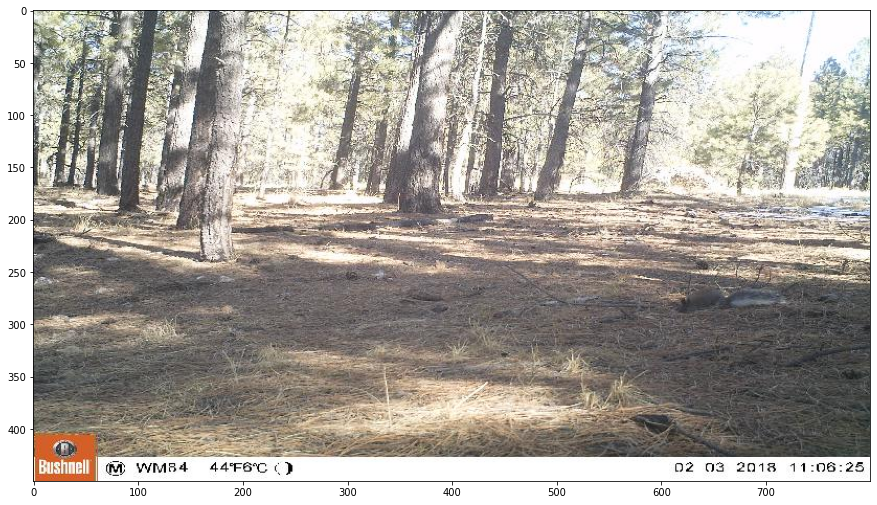

fauna
54.17000198364258


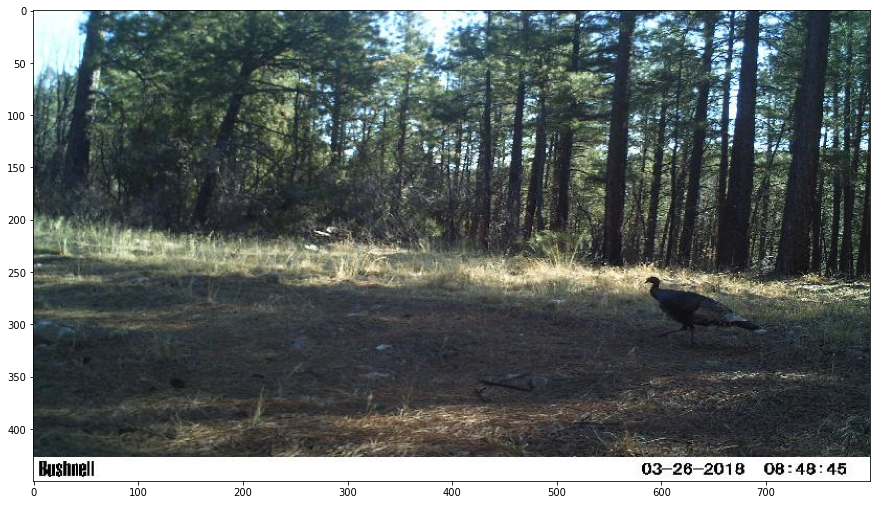

fauna
65.6189956665039


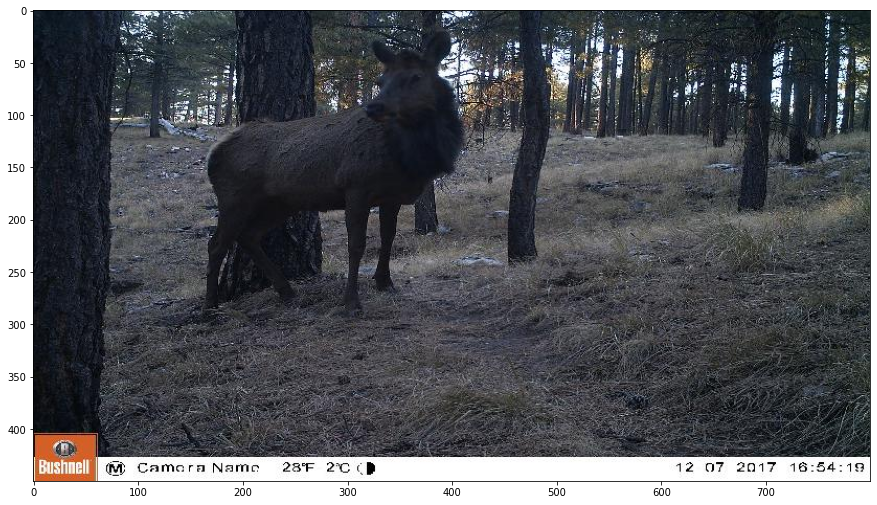

fauna
62.822998046875


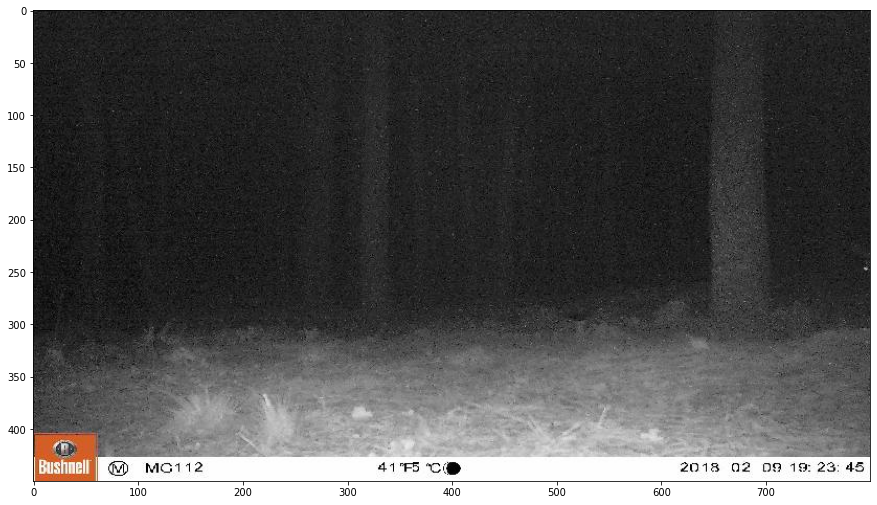

fauna
53.974002838134766


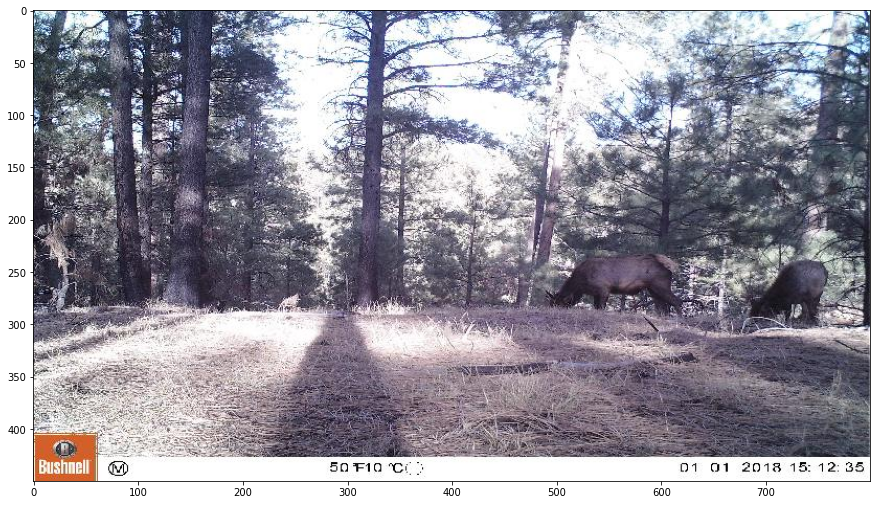

empty
51.84700012207031


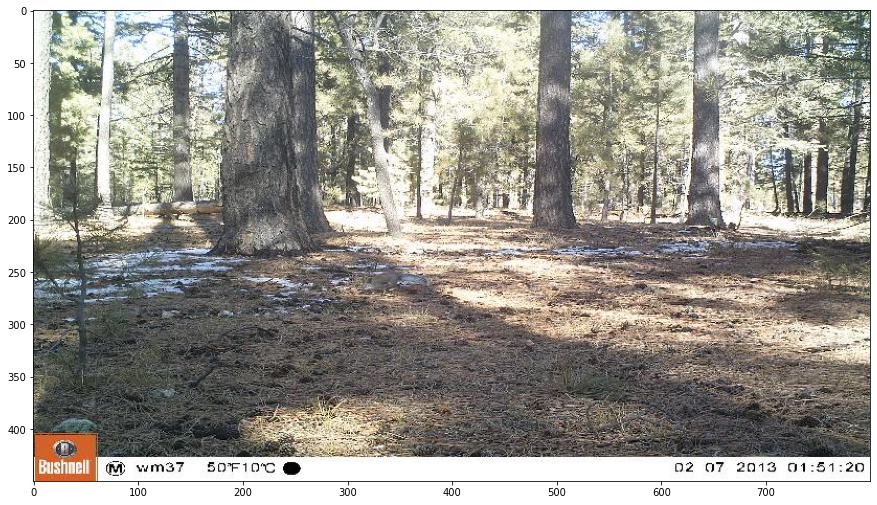

fauna
58.54899978637695


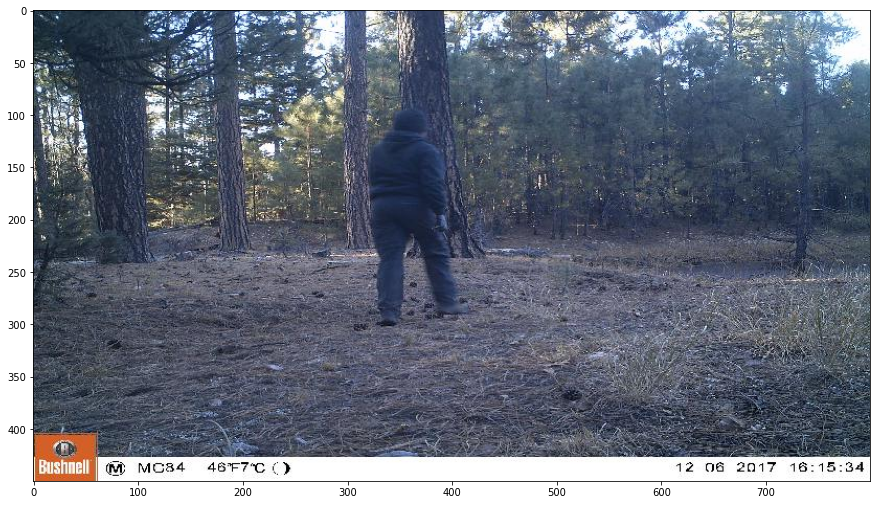

empty
52.06700134277344


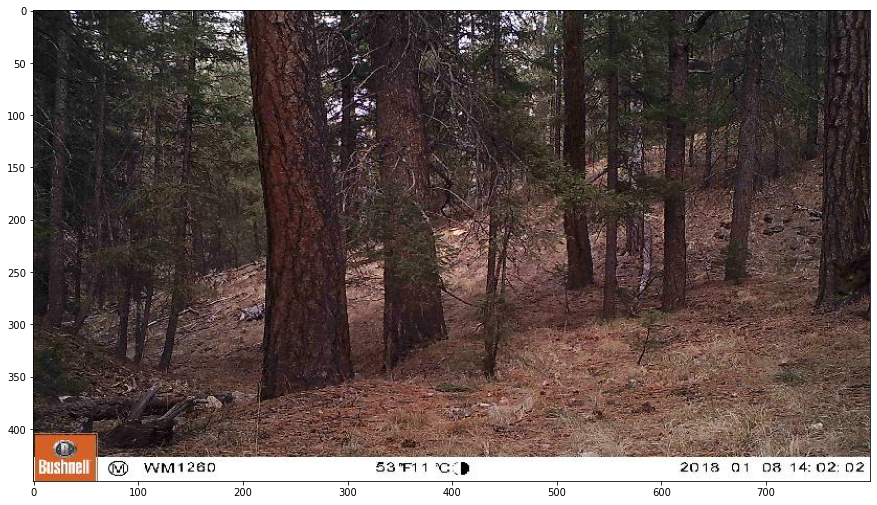

fauna
58.87699890136719


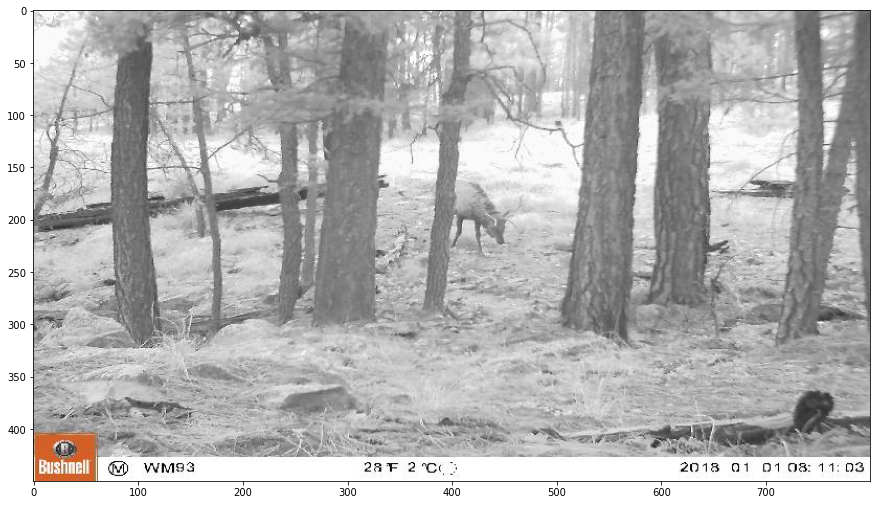

fauna
65.71499633789062


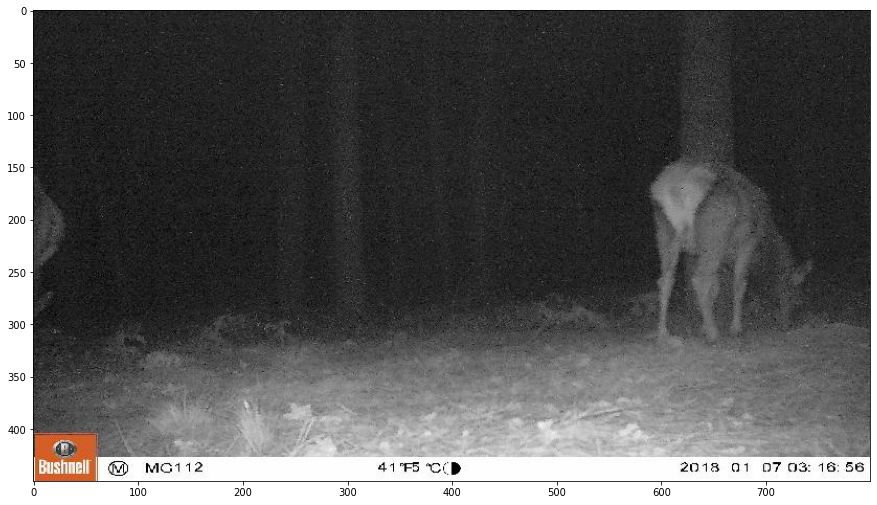

fauna
64.9530029296875


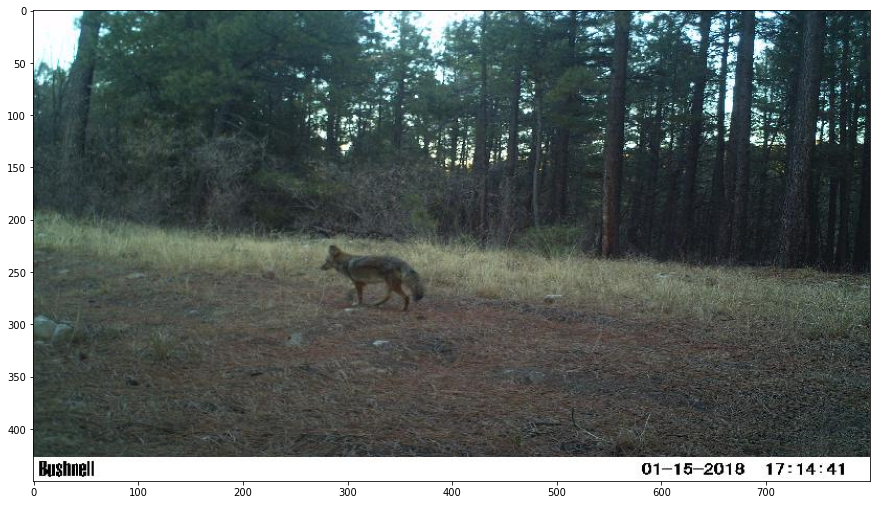

fauna
62.16600036621094


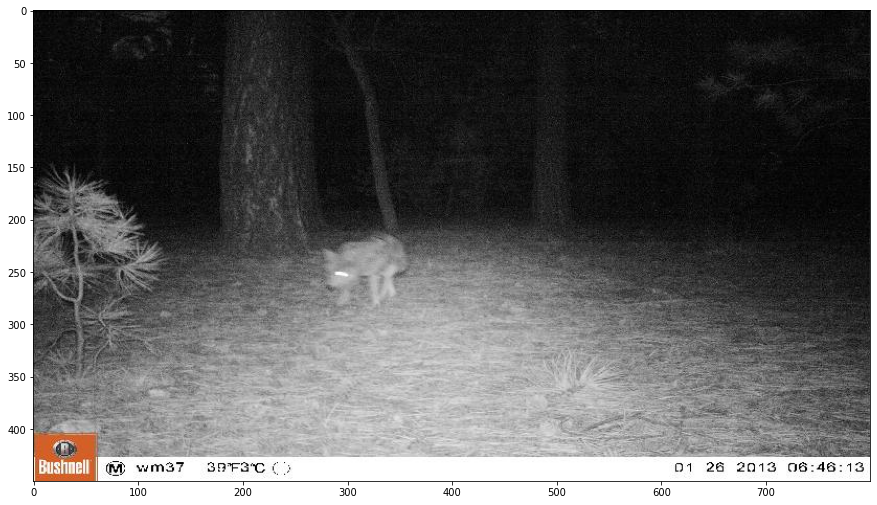

empty
51.73400115966797


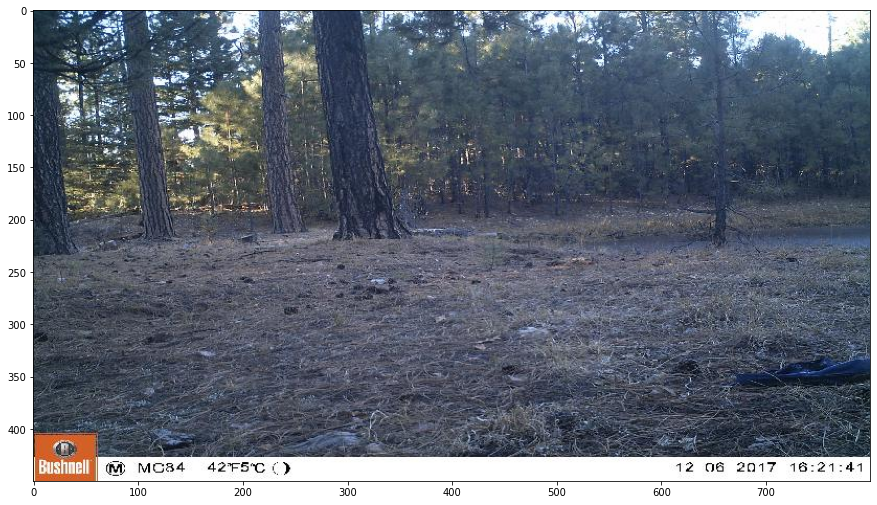

fauna
60.62399673461914


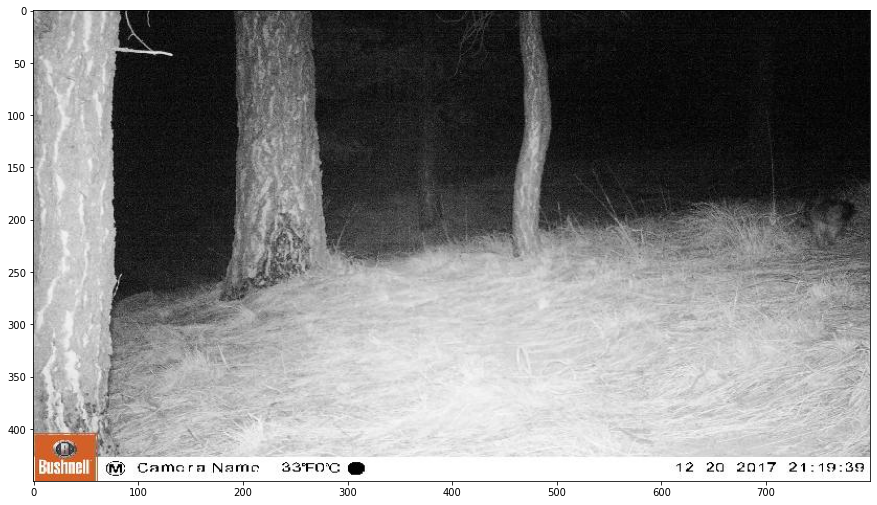

In [124]:
for element in list_local_images_classif_and_confidence:
    plt.figure(figsize=(15,15))
    img_path, classif,confid = element
    plt_img = plt.imread(img_path)
    print(classif)
    print(confid)
    plt.imshow(plt_img)
    plt.show()

## Stop the model

https://docs.aws.amazon.com/rekognition/latest/customlabels-dg/gs-step-stop-model.html

In [265]:
def stop_model(model_arn, region):
    client = boto3.client('rekognition', region_name=region)
    
    print('Stopping model:' + model_arn)
    
    # Stop the model
    try:
        response = client.stop_project_version(ProjectVersionArn=model_arn)
        status = response['Status']
        print('Status: ' + status)
    except Exception as e:
            print(e)

In [267]:
rekog_model_arn

'arn:aws:rekognition:us-east-1:376433248489:project/fauna_empty_14-03-2022/version/14-03-2022_1/1647277564695'

In [268]:
stop_model(rekog_model_arn, region)

Stopping model:arn:aws:rekognition:us-east-1:376433248489:project/fauna_empty_14-03-2022/version/14-03-2022_1/1647277564695
Status: STOPPING


In [273]:
client = boto3.client('rekognition', region_name=region)
client.describe_project_versions(
    ProjectArn=rekog_proj_arn,
    VersionNames=[version_name])

{'ProjectVersionDescriptions': [{'ProjectVersionArn': 'arn:aws:rekognition:us-east-1:376433248489:project/fauna_empty_14-03-2022/version/14-03-2022_1/1647277564695',
   'CreationTimestamp': datetime.datetime(2022, 3, 14, 11, 6, 4, 695000, tzinfo=tzlocal()),
   'MinInferenceUnits': 1,
   'Status': 'STOPPED',
   'StatusMessage': 'The model has stopped running.',
   'BillableTrainingTimeInSeconds': 3040,
   'TrainingEndTimestamp': datetime.datetime(2022, 3, 14, 11, 53, 3, 34000, tzinfo=tzlocal()),
   'OutputConfig': {'S3Bucket': 'rekognition-fauna-empty-results',
    'S3KeyPrefix': '14-03-2022'},
   'TrainingDataResult': {'Input': {},
    'Output': {'Assets': [{'GroundTruthManifest': {'S3Object': {'Bucket': 'rekognition-fauna-empty-results',
         'Name': '14-03-2022/TrainingGroundTruth-fauna_empty_14-03-2022-14-03-2022_1.json'}}}]},
    'Validation': {'Assets': [{'GroundTruthManifest': {'S3Object': {'Bucket': 'rekognition-fauna-empty-results',
         'Name': '14-03-2022/TrainingMani